<a href="https://colab.research.google.com/github/wagner1986/singular-points/blob/siamese/kornia-single-points.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# !git clone -b siamese https://github.com/wagner1986/singular-points.git singular_points
# !pip install kornia e2cnn kornia_moons

# !pwd
# %cd /content/singular_points
# !pwd

In [2]:
import torch
import numpy as np
import cv2
import best.singular_point as sp
from teste_util import *
import teste_util as TS

# Fixar a semente do Torch para operações específicas
fixed_seed()

# leitura dos dados
trainloader,testloader =read_dataload_flower(sp.args.img_size,'./data/datasets')
iterator=iter(testloader)
img,labels = next(iterator)
print(img.shape,labels.shape)

# Carregar o modelo singular points
path_single = './data/models/sp_map_fo_30.pth'
sp.args.num_channels = 1
model = sp.SingularPoints(args=sp.args).to(sp.device)
load_model(model,path_single,sp.device)

#gerar variacao de transformacoes pespectivas e fotometrica
params_lists =AugmentationParamsGenerator(6,img.shape)

torch.Size([60, 1, 120, 120]) torch.Size([60])
Namespace(exported=False, num_channels=1, pyramid_levels=3, scale_pyramid=1.3, dim_first=3, dim_second=5, dim_third=8, group_size=36, epochs=70, border_size=12, box_size=21, nms_size=5, img_size=120, batch_size=16, path_data='./data', path_model='model.pt', is_loss_ssim=True, margin_loss=2.0, outlier_rejection=False, show_feature=False)


/home/wagner/.local/lib/python3.11/site-packages/e2cnn/nn/modules/r2_conv/basisexpansion_singleblock.py:80: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/IndexingUtils.h:27.)
  full_mask[mask] = norms.to(torch.uint8)


Model loaded from ./data/models/sp_map_fo_30.pth


### CustonNetDetector

In [3]:
def create_circular_mask(h, w, center=None, radius=None):
    if center is None:  # use the middle of the image
        center = (int(w / 2), int(h / 2))
    if radius is None:  # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w - center[0], h - center[1])
    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0]) ** 2 + (Y - center[1]) ** 2)
    mask = dist_from_center <= radius
    return mask

from torch import nn

class Detector(nn.Module):
        def __init__(self,model) -> None:
           super().__init__()
           self.model = model
        def forward(self, x):
            features_key,features_key_summary,features_ori,features_ori_summary,max_coords_values, max_map= self.model(x)
            return features_key_summary

class Detector2(nn.Module):
        def __init__(self,model) -> None:
           super().__init__()
           self.model = model
        def forward(self, x):
            features_key,features_key_summary,features_ori,features_ori_summary,max_coords_values, max_map= self.model(x)
            return features_key


detec = Detector(model)
detec2 = Detector2(model)


In [4]:
import torch
import kornia
from kornia.feature.scale_space_detector import get_default_detector_config, MultiResolutionDetector

device = sp.device

keynet_default_config = {
    'num_filters': 8,
    'num_levels': 3,
    'kernel_size': 5,
    'Detector_conf': {'nms_size': 5, 'pyramid_levels': 2, 'up_levels': 1, 'scale_factor_levels': 1.3, 's_mult': 15.0},
}

class CustomNetDetector(MultiResolutionDetector):
    def __init__(
        self,
        model,
        pretrained: bool = True,
        num_features: int = 60,
        keynet_conf=keynet_default_config,
        ori_module=kornia.feature.LAFOrienter(PS),
        aff_module=None,#kornia.feature.LAFAffineShapeEstimator(PS),
    ):
        super().__init__(model, num_features, keynet_conf['Detector_conf'], ori_module, aff_module)


# # timg_gray = img.to(device)#timg_gray.to(device)
sift = kornia.feature.SIFTDescriptor(PS, rootsift=True).to(device)
# descriptor = sift
detector = CustomNetDetector(detec).to(device)


In [5]:
from siamesa_e2cnn import Siamesa
n_channel =8
model_siamese =Siamesa(n_channel=n_channel)
model_siamese.to(sp.device)
load_model(model_siamese, './data/models/siamese_flowers_sp.pt',sp.device)

RuntimeError: Error(s) in loading state_dict for Siamesa:
	Missing key(s) in state_dict: "feature.block1.0.weights", "feature.block1.0.filter", "feature.block1.0._basisexpansion.block_expansion_('irrep_0', 'regular').sampled_basis", "feature.block1.1.indices_18", "feature.block1.1.batch_norm_[18].weight", "feature.block1.1.batch_norm_[18].bias", "feature.block1.1.batch_norm_[18].running_mean", "feature.block1.1.batch_norm_[18].running_var", "feature.pool1.filter", "feature.block2.0.weights", "feature.block2.0.filter", "feature.block2.0._basisexpansion.block_expansion_('regular', 'regular').sampled_basis", "feature.block2.1.indices_18", "feature.block2.1.batch_norm_[18].weight", "feature.block2.1.batch_norm_[18].bias", "feature.block2.1.batch_norm_[18].running_mean", "feature.block2.1.batch_norm_[18].running_var", "feature.block3.0.weights", "feature.block3.0.filter", "feature.block3.0._basisexpansion.block_expansion_('regular', 'regular').sampled_basis", "feature.block3.1.indices_18", "feature.block3.1.batch_norm_[18].weight", "feature.block3.1.batch_norm_[18].bias", "feature.block3.1.batch_norm_[18].running_mean", "feature.block3.1.batch_norm_[18].running_var", "feature.block3.3.in_indices_18", "feature.block3.3.out_indices_18", "discriminator.dense1.weight", "discriminator.dense1.bias", "discriminator.dense2.weight", "discriminator.dense2.bias". 
	Unexpected key(s) in state_dict: "block1.0.weights", "block1.0.filter", "block1.0._basisexpansion.block_expansion_('irrep_0', 'regular').sampled_basis", "block1.1.indices_18", "block1.1.batch_norm_[18].weight", "block1.1.batch_norm_[18].bias", "block1.1.batch_norm_[18].running_mean", "block1.1.batch_norm_[18].running_var", "block1.1.batch_norm_[18].num_batches_tracked", "pool1.filter", "block2.0.weights", "block2.0.filter", "block2.0._basisexpansion.block_expansion_('regular', 'regular').sampled_basis", "block2.1.indices_18", "block2.1.batch_norm_[18].weight", "block2.1.batch_norm_[18].bias", "block2.1.batch_norm_[18].running_mean", "block2.1.batch_norm_[18].running_var", "block2.1.batch_norm_[18].num_batches_tracked", "block3.0.weights", "block3.0.filter", "block3.0._basisexpansion.block_expansion_('regular', 'regular').sampled_basis", "block3.1.indices_18", "block3.1.batch_norm_[18].weight", "block3.1.batch_norm_[18].bias", "block3.1.batch_norm_[18].running_mean", "block3.1.batch_norm_[18].running_var", "block3.1.batch_norm_[18].num_batches_tracked", "block3.3.in_indices_18", "block3.3.out_indices_18". 

In [ ]:
import matplotlib.pyplot as plt
def detect_and_extract_features(image, detector, PS):
    with torch.no_grad():
        lafs, resps = detector(image[None])
        map = detec2(image[None])
        # patches = kornia.feature.extract_patches_from_pyramid(image[None], lafs, PS)
        patches = kornia.feature.extract_patches_from_pyramid(map, lafs, PS)
        B, N, CH, H, W = patches.size()
        # print('patches  ',patches.shape,B, N, CH, H, W)
        # descs = descriptor(patches.view(B * N, CH, H, W)).view(B, N, -1)
        # print('descs  ',descs.shape)
        return lafs, patches

def detect_extract_feat_in_batch(batch_img, detector, PS):
    repo_lafs_desc = []
    with torch.no_grad():
        for image  in batch_img:
            try:
                lafs, descs = detect_and_extract_features(image, detector, PS)
                # print('lafs/descs ',lafs.shape,descs.shape)
                repo_lafs_desc.append((lafs,descs))
            except RuntimeError as e:
                plt.imshow(kornia.tensor_to_image(image.cpu()))
                plt.show()
                result = detec(image[None])

                plt.imshow(kornia.tensor_to_image(result.cpu()))
                plt.show()

    return repo_lafs_desc

def compute_homography(lafs1, lafs2, matches):
    src_pts = lafs1[0, matches[:, 0], :, 2].data.cpu().numpy()
    dst_pts = lafs2[0, matches[:, 1], :, 2].data.cpu().numpy()
    F, inliers_mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 1.0, 0.999, 1000)
    inliers_point = matches[torch.from_numpy(inliers_mask).bool().squeeze(), :]
    return inliers_mask


def matching_imagens(ref_img,batch_img, repo_lafs_desc,index_correto=None):
    best_match_info = None
    best_match_count = 0
    best_match_index = 0
    with torch.no_grad():
        # Detectar e extrair características da imagem de referência
        lafs_ref, patchs_ref = detect_and_extract_features(ref_img, detector, PS)

        for i, (lafs_i, patchs_i) in enumerate(repo_lafs_desc):
            # Detectar e extrair características da imagem atual do batch
            # lafs_i, descs_i = detect_and_extract_features(img, detector, descriptor, PS)
            # Comparar as características da imagem de referência com a imagem atual do batch
            matches = model_siamese(patchs_ref[0], patchs_i[0])
            if matches.shape[0] >= 4:
                # Cálculo da homografia
                inliers_mask = compute_homography(lafs_ref, lafs_i, matches)
                # print(lafs_ref[0][None].shape, lafs_ref[0].shape, matches.shape, inliers_mask.shape)

                # Check if this match is better than the previous best match
                if matches.shape[0] > best_match_count:
                    best_match_info = (lafs_ref[0][None].cpu(), lafs_i[0][None].cpu(), matches.cpu(),
                                       kornia.tensor_to_image(ref_img.cpu()), kornia.tensor_to_image(batch_img[i].cpu()),
                                       inliers_mask)
                    best_match_count = matches.shape[0]
                    best_match_index = i

        if best_match_info is not None and best_match_index!=index_correto:# TODO: Remove this condition best_match_index==0
            # Plot the best match
            from kornia_moons.viz import draw_LAF_matches
            print('ERRO index_correto',index_correto,'best_match_index',best_match_index ',best_match_index, 'best_match_count ',best_match_count)
            draw_LAF_matches(
                *best_match_info,
                draw_dict={"inlier_color": (0.2, 1, 0.2), "tentative_color": (1, 1, 0.2, 0.3), "feature_color": None, "vertical": False},
            )
            plt.show()
        else:
            print("correto",index_correto, 'best_match_index ',best_match_index, 'best_match_count ',best_match_count)
        
    return best_match_index


  0%|          | 0/17 [00:00<?, ?it/s]

index correto 0 best_match_index  0 best_match_count  27
index correto 1 best_match_index  1 best_match_count  27
index correto 2 best_match_index  2 best_match_count  24
index correto 3 best_match_index  3 best_match_count  23
index correto 4 best_match_index  4 best_match_count  22
index correto 5 best_match_index  5 best_match_count  22
index correto 6 best_match_index  6 best_match_count  26
index correto 7 best_match_index  7 best_match_count  21
best_match_index  39 best_match_count  24


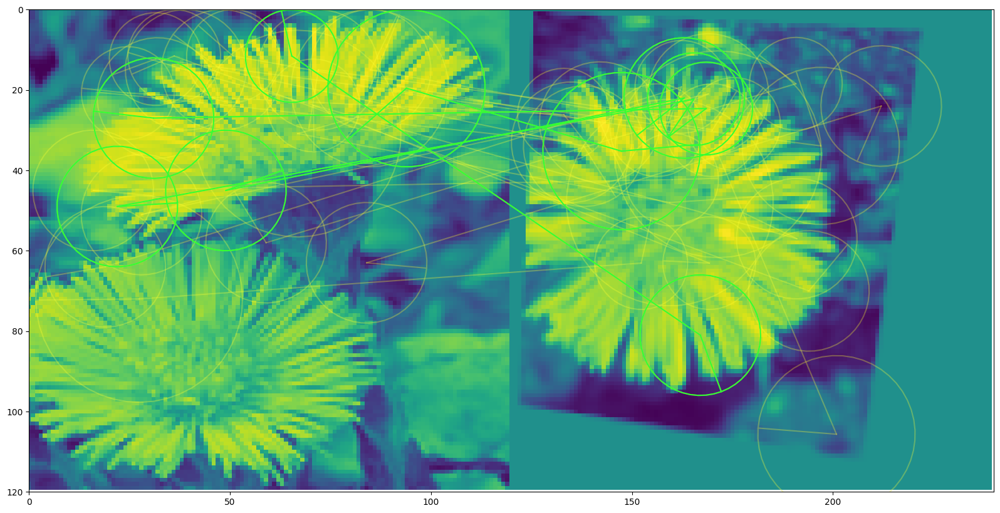

index correto 9 best_match_index  9 best_match_count  12
index correto 10 best_match_index  10 best_match_count  26
index correto 11 best_match_index  11 best_match_count  21
index correto 12 best_match_index  12 best_match_count  22
index correto 13 best_match_index  13 best_match_count  30
index correto 14 best_match_index  14 best_match_count  18
best_match_index  36 best_match_count  18


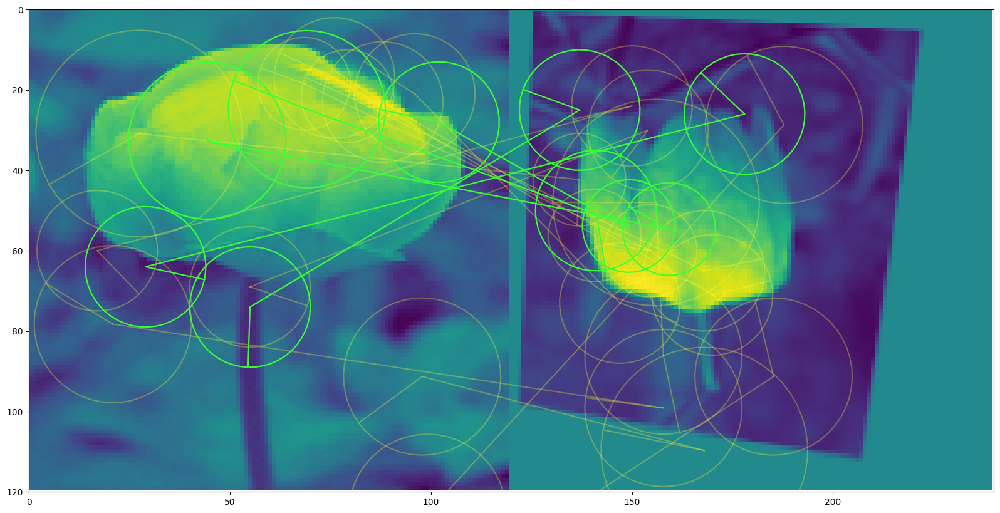

best_match_index  29 best_match_count  18


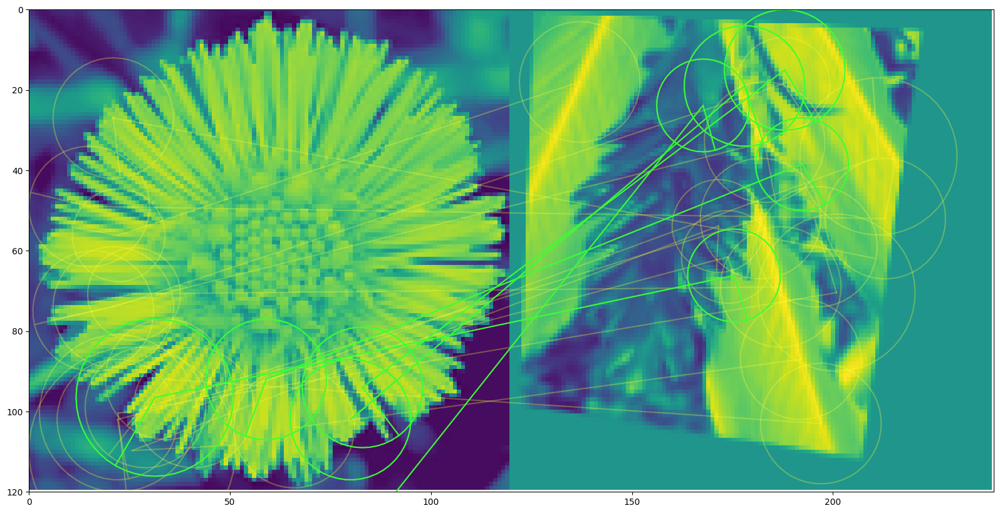

index correto 17 best_match_index  17 best_match_count  24
index correto 18 best_match_index  18 best_match_count  23
index correto 19 best_match_index  19 best_match_count  22
best_match_index  4 best_match_count  15


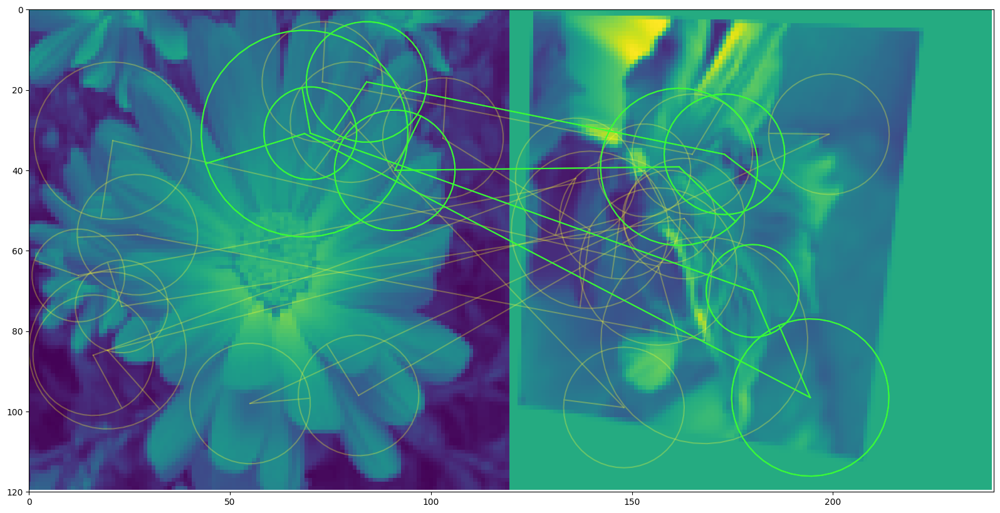

best_match_index  33 best_match_count  17


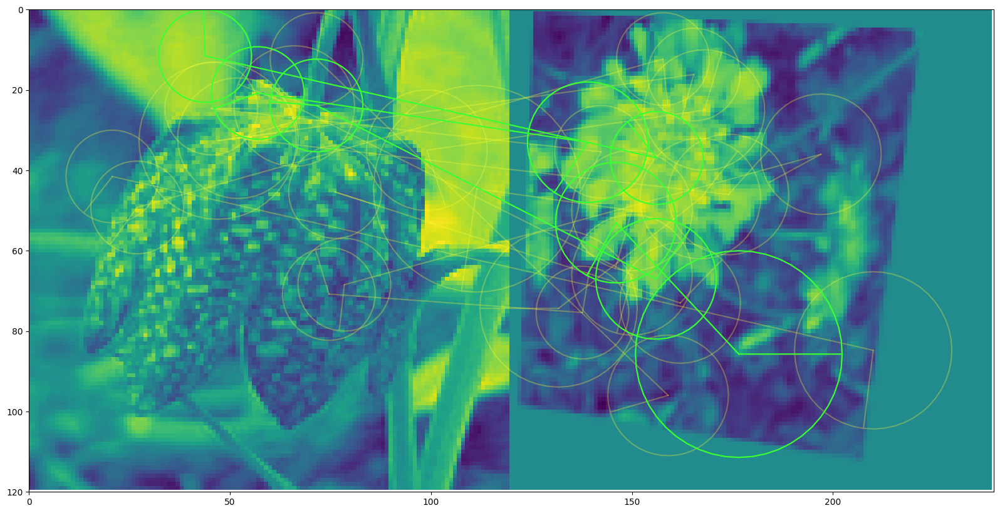

best_match_index  34 best_match_count  19


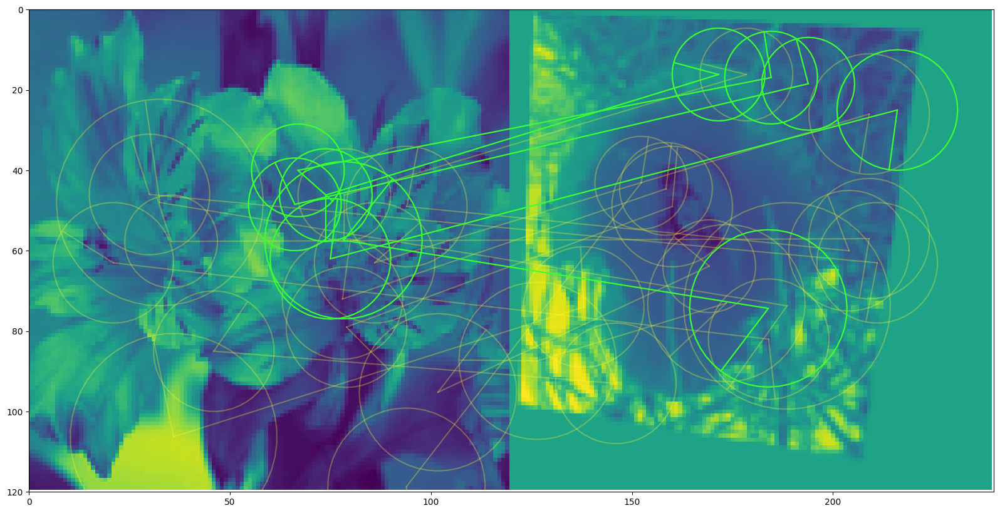

index correto 23 best_match_index  23 best_match_count  27
index correto 24 best_match_index  24 best_match_count  23
best_match_index  31 best_match_count  21


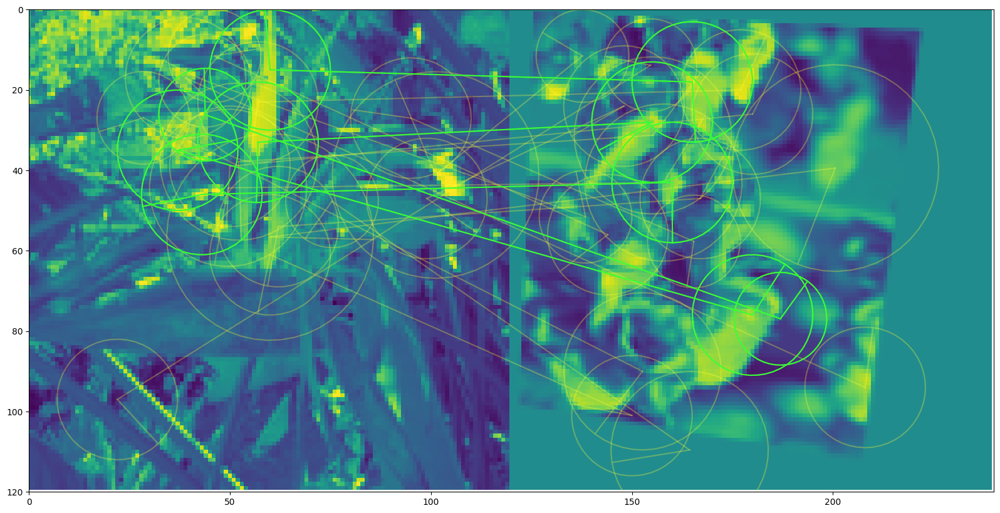

best_match_index  44 best_match_count  25


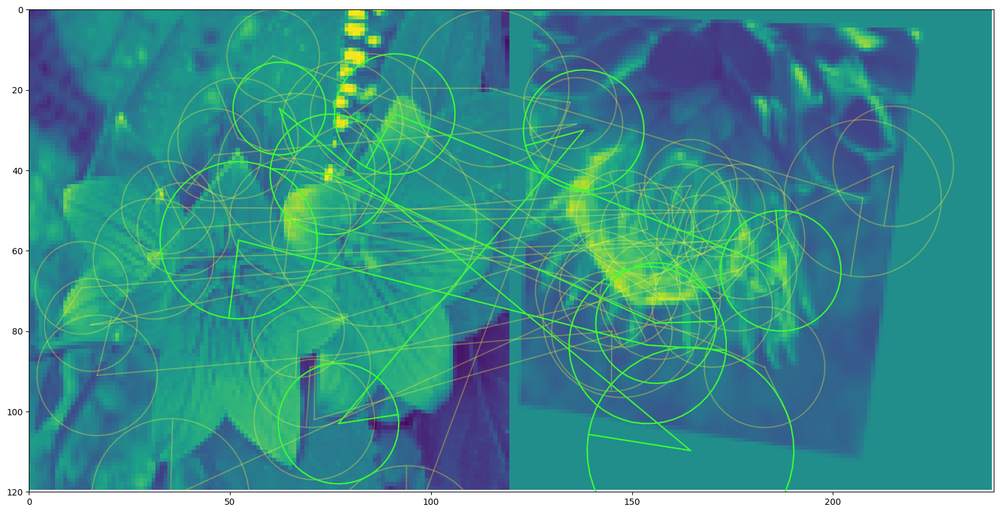

index correto 27 best_match_index  27 best_match_count  26
best_match_index  7 best_match_count  13


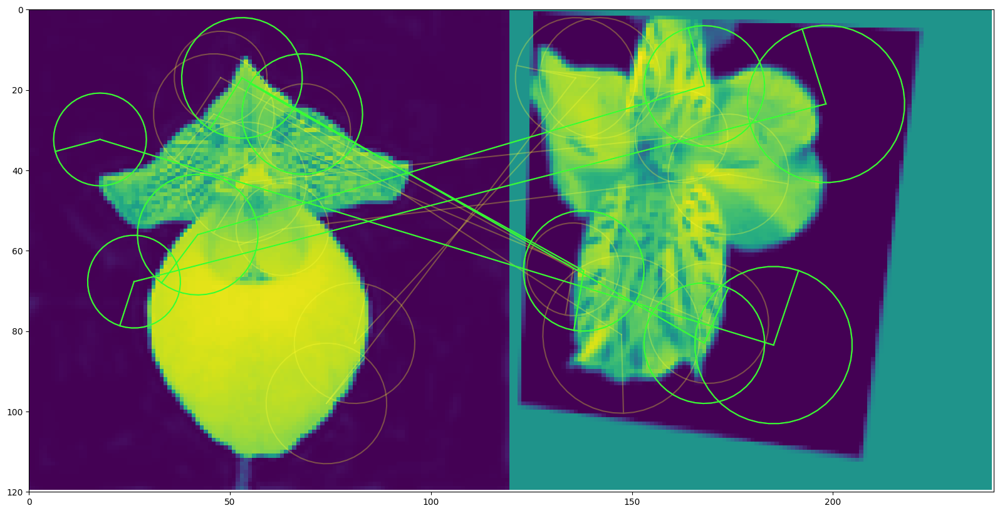

index correto 29 best_match_index  29 best_match_count  24
index correto 30 best_match_index  30 best_match_count  25
index correto 31 best_match_index  31 best_match_count  25
index correto 32 best_match_index  32 best_match_count  27
index correto 33 best_match_index  33 best_match_count  26
index correto 34 best_match_index  34 best_match_count  22
index correto 35 best_match_index  35 best_match_count  23
index correto 36 best_match_index  36 best_match_count  27
index correto 37 best_match_index  37 best_match_count  28
best_match_index  11 best_match_count  18


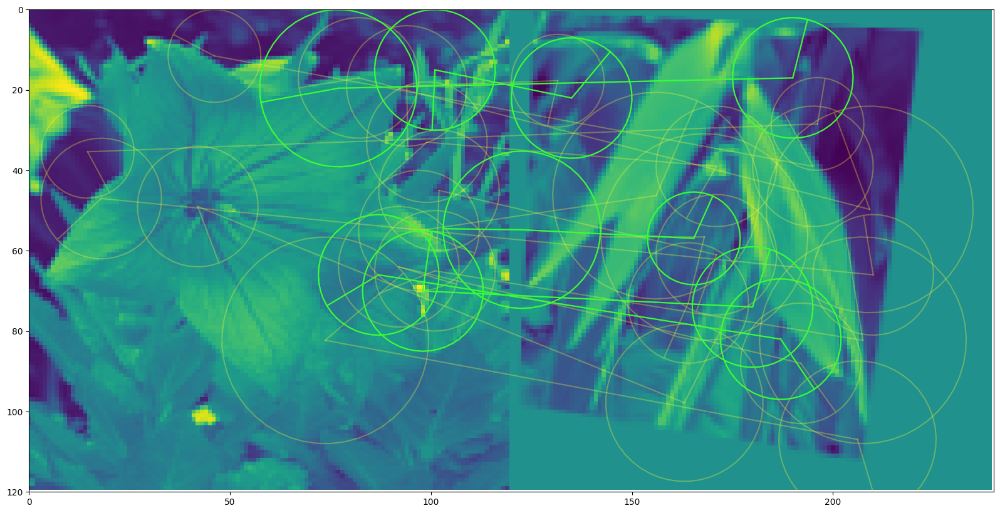

index correto 39 best_match_index  39 best_match_count  23
index correto 40 best_match_index  40 best_match_count  18
best_match_index  11 best_match_count  19


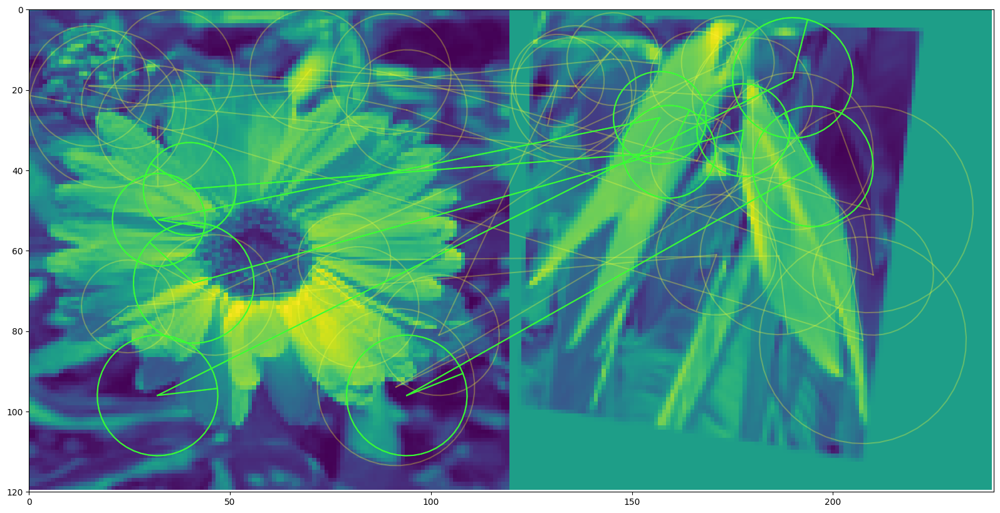

index correto 42 best_match_index  42 best_match_count  25
index correto 43 best_match_index  43 best_match_count  26
index correto 44 best_match_index  44 best_match_count  29
best_match_index  0 best_match_count  20


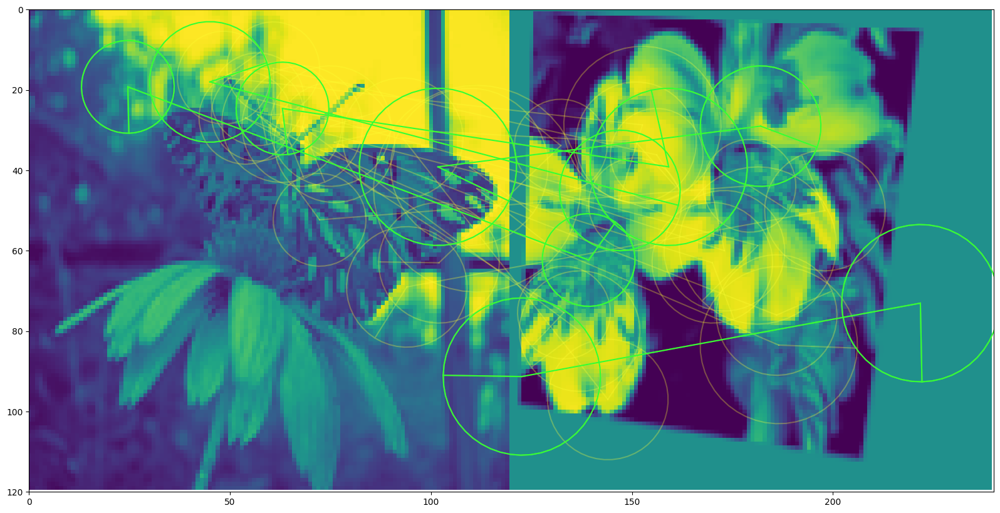

index correto 46 best_match_index  46 best_match_count  19
index correto 47 best_match_index  47 best_match_count  24
index correto 48 best_match_index  48 best_match_count  24
index correto 49 best_match_index  49 best_match_count  14
index correto 50 best_match_index  50 best_match_count  19
index correto 51 best_match_index  51 best_match_count  21
index correto 52 best_match_index  52 best_match_count  24
index correto 53 best_match_index  53 best_match_count  21
best_match_index  11 best_match_count  19


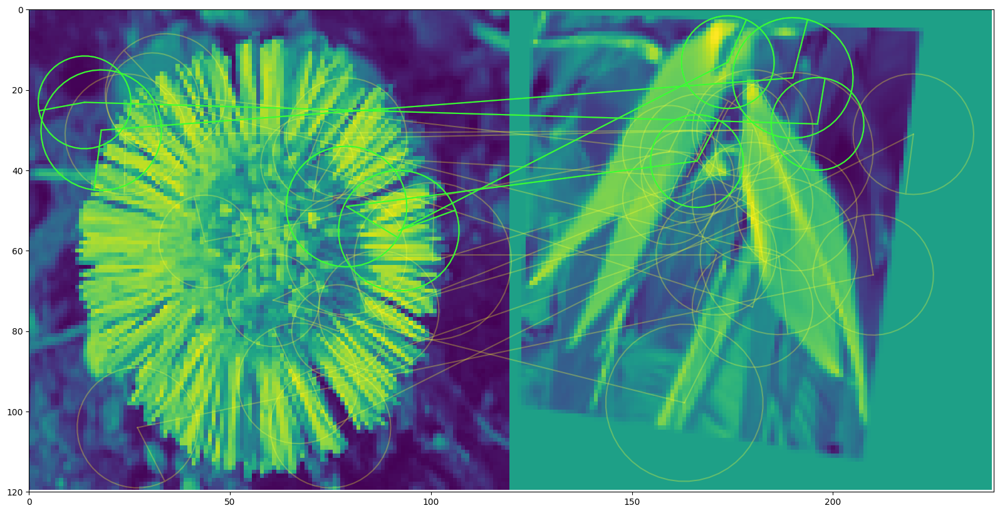

index correto 55 best_match_index  55 best_match_count  21
index correto 56 best_match_index  56 best_match_count  28
index correto 57 best_match_index  57 best_match_count  25
index correto 58 best_match_index  58 best_match_count  27
index correto 59 best_match_index  59 best_match_count  27
index correto 0 best_match_index  0 best_match_count  26
index correto 1 best_match_index  1 best_match_count  22
best_match_index  0 best_match_count  21


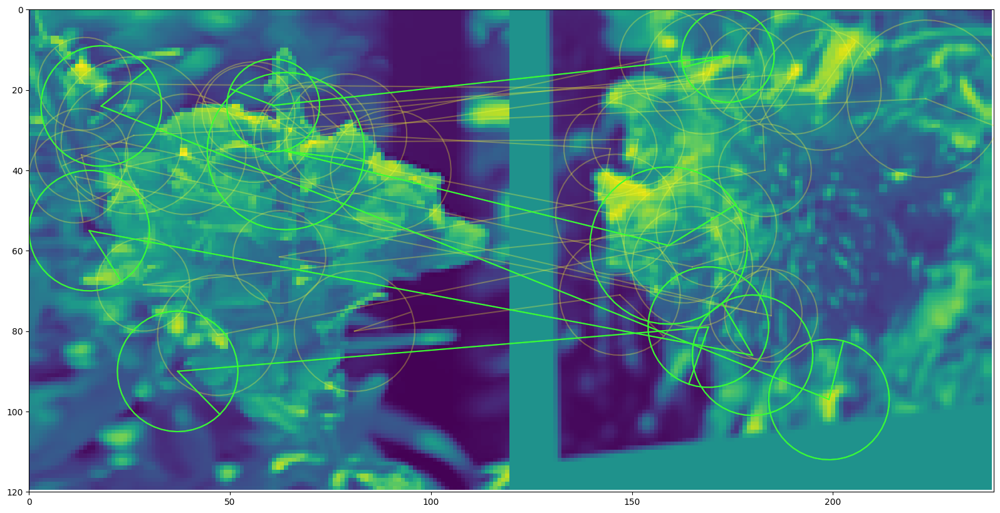

index correto 3 best_match_index  3 best_match_count  26
index correto 4 best_match_index  4 best_match_count  24
index correto 5 best_match_index  5 best_match_count  25
best_match_index  13 best_match_count  23


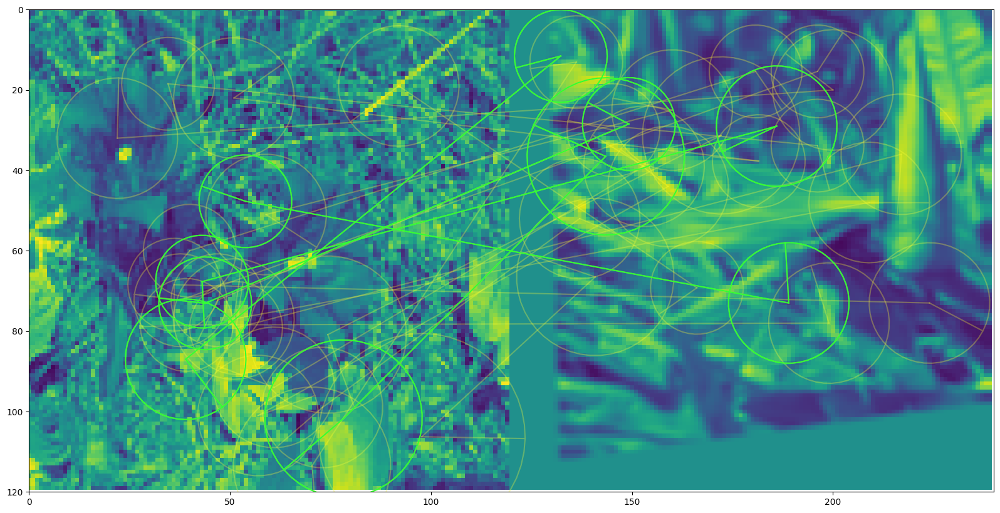

best_match_index  3 best_match_count  21


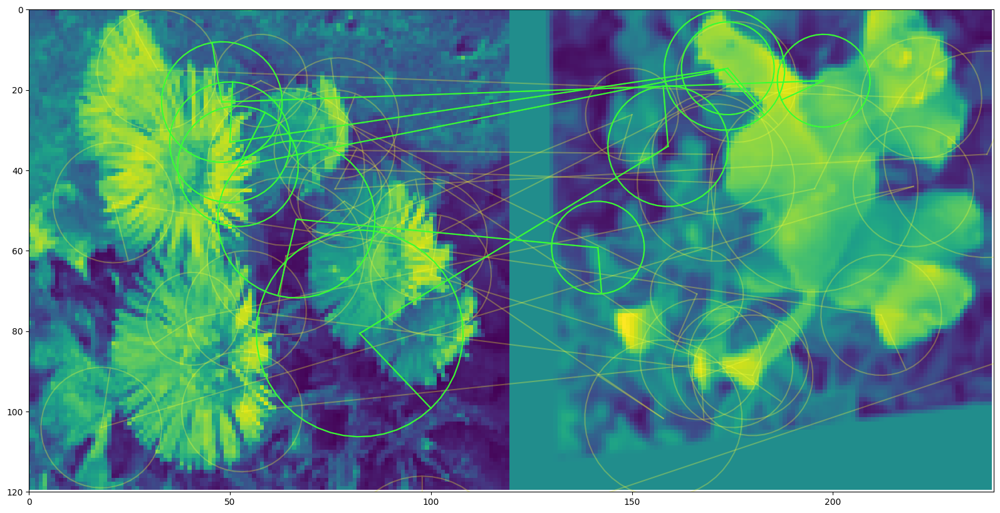

best_match_index  34 best_match_count  24


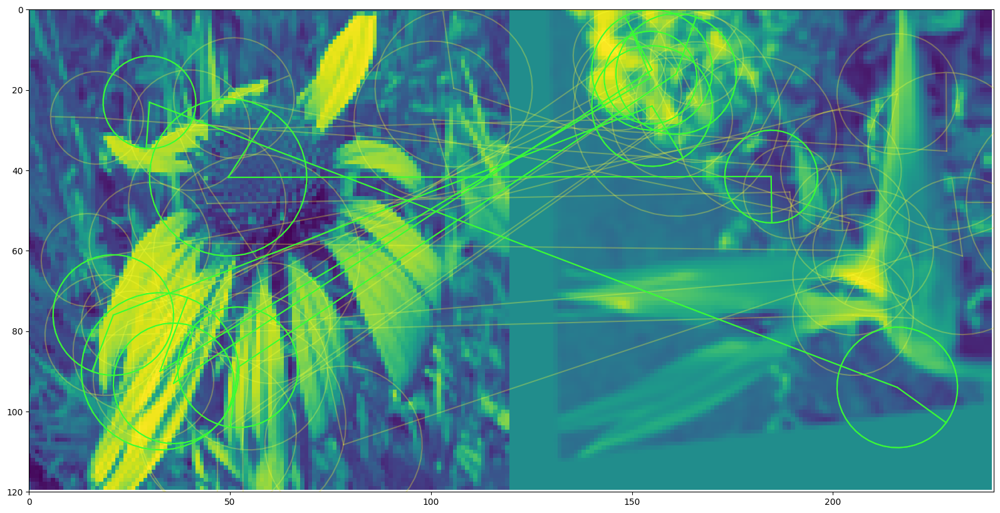

index correto 9 best_match_index  9 best_match_count  24
index correto 10 best_match_index  10 best_match_count  30
index correto 11 best_match_index  11 best_match_count  25
index correto 12 best_match_index  12 best_match_count  23
best_match_index  0 best_match_count  22


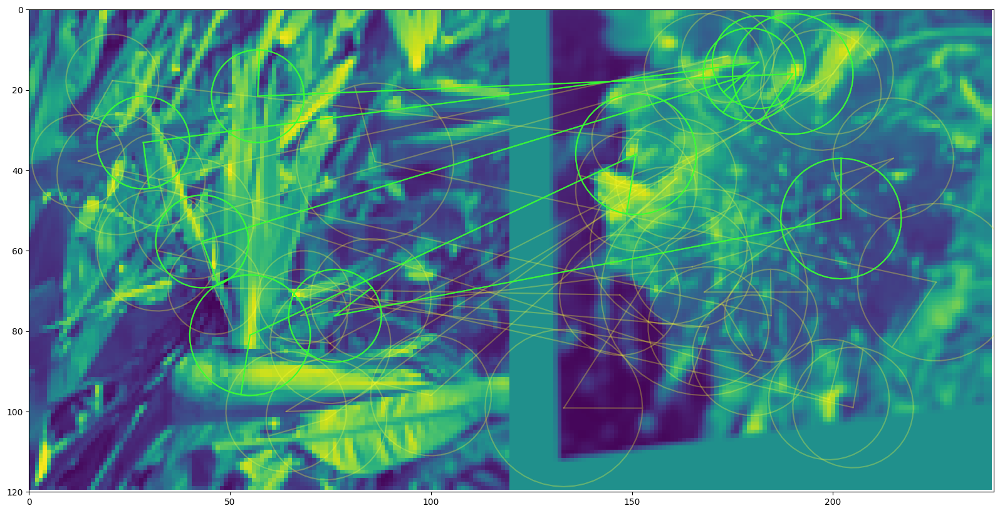

best_match_index  17 best_match_count  24


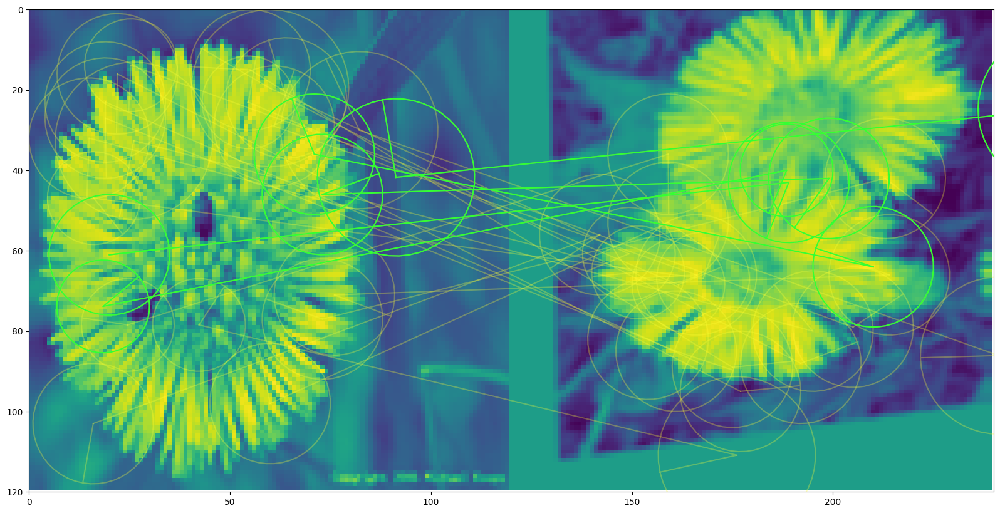

index correto 15 best_match_index  15 best_match_count  19
index correto 16 best_match_index  16 best_match_count  29
index correto 17 best_match_index  17 best_match_count  23
index correto 18 best_match_index  18 best_match_count  26
index correto 19 best_match_index  19 best_match_count  27
index correto 20 best_match_index  20 best_match_count  24
index correto 21 best_match_index  21 best_match_count  25


KeyboardInterrupt: 

: 

In [ ]:
torch.manual_seed(0)
torch.cuda.manual_seed(0)

params_lists.aug_list.data_keys =["input"]
aug_list = params_lists.aug_list

acertos = 0
total = 0
from tqdm.notebook import tqdm
pbar =  tqdm(testloader)
for imgs_batch,labels_batch in pbar:# itera em todo dataset
    imgs_batch = imgs_batch.to(device)

    params_item = next(params_lists)
    timg_gray_t = aug_list(imgs_batch,params=params_item)
    repo_lafs_desc= detect_extract_feat_in_batch(timg_gray_t,detector,PS)

    for i,img_gray in enumerate(imgs_batch):# itera em cada batch
        
        match_index = matching_imagens(img_gray,timg_gray_t,repo_lafs_desc,i)
        total+=1
        if match_index == i:
            acertos += 1
            
        pbar.set_description(f"acertos/total: {acertos}/{total}  ")
print("acertos: ",acertos)